# Song Popularity

## Description:
Humans have greatly associated themselves with Songs & Music. It can improve mood, decrease pain and anxiety, and facilitate opportunities for emotional expression. Research suggests that music can benefit our physical and mental health in numerous ways.

Lately, multiple studies have been carried out to understand songs & it's popularity based on certain factors. Such song samples are broken down & their parameters are recorded to tabulate. Predicting the Song Popularity is the main aim.

The project is simple yet challenging, to predict the song popularity based on energy, acoustics, instumentalness, liveness, dancibility, etc. The dataset is large & it's complexity arises due to the fact that it has strong multicollinearity. Can you overcome these obstacles & build a decent predictive model?

## Acknowledgement:
The dataset is referred from Kaggle.

## Key Features:
song_name: Categorical variable containing the name of the song, 

song_popularity: integer variable that has a range from 0 to 100 (target variable)

song_duration_ms: float variable that contains the duration of the song in milliseconds

acousticness: float variable that contains the level of acousticness of the song between 0 and 1

danceability: float variable that contains the level of danceability of the song between 0 and 1

energy: float variable that contains the level of energy vibe of the song between 0 and 1

instrumentalness:float variable that contains the level of instrumentalness of the song between 0 and 1
 
key: integer variable that has a range from 0 to 11
 
liveness: float variable that contains the level of liveness of the song between 0 and 1
       
loudness: float variable that contains the level of loudness of the song between 0 and 1
 
audio_mode: binary variable whether the song  contains auto mode or not 

speechiness: float variable that contains the level of speechiness  of the song between 0 and 1

tempo: float variable about the tempo of the song

time_signature: integer variable about the level of time signature

audio_valence: float variable that contains the level of acousticness of the song between 0 and 1

In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.linear_model import LinearRegression,LassoCV,RidgeCV,ElasticNetCV,BayesianRidge
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler,LabelEncoder

In [5]:
df = pd.read_csv('data/song_data.csv')
df

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
0,Boulevard of Broken Dreams,73,262333,0.005520,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.474
1,In The End,66,216933,0.010300,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.370
2,Seven Nation Army,76,231733,0.008170,0.737,0.463,0.447000,0,0.2550,-7.828,1,0.0792,123.881,4,0.324
3,By The Way,74,216933,0.026400,0.451,0.970,0.003550,0,0.1020,-4.938,1,0.1070,122.444,4,0.198
4,How You Remind Me,56,223826,0.000954,0.447,0.766,0.000000,10,0.1130,-5.065,1,0.0313,172.011,4,0.574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18830,Let It Breathe,60,159645,0.893000,0.500,0.151,0.000065,11,0.1110,-16.107,1,0.0348,113.969,4,0.300
18831,Answers,60,205666,0.765000,0.495,0.161,0.000001,11,0.1050,-14.078,0,0.0301,94.286,4,0.265
18832,Sudden Love (Acoustic),23,182211,0.847000,0.719,0.325,0.000000,0,0.1250,-12.222,1,0.0355,130.534,4,0.286
18833,Gentle on My Mind,55,352280,0.945000,0.488,0.326,0.015700,3,0.1190,-12.020,1,0.0328,106.063,4,0.323


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18835 entries, 0 to 18834
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_name         18835 non-null  object 
 1   song_popularity   18835 non-null  int64  
 2   song_duration_ms  18835 non-null  int64  
 3   acousticness      18835 non-null  float64
 4   danceability      18835 non-null  float64
 5   energy            18835 non-null  float64
 6   instrumentalness  18835 non-null  float64
 7   key               18835 non-null  int64  
 8   liveness          18835 non-null  float64
 9   loudness          18835 non-null  float64
 10  audio_mode        18835 non-null  int64  
 11  speechiness       18835 non-null  float64
 12  tempo             18835 non-null  float64
 13  time_signature    18835 non-null  int64  
 14  audio_valence     18835 non-null  float64
dtypes: float64(9), int64(5), object(1)
memory usage: 2.2+ MB


In [8]:
df.describe()

,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
count,18835.000000,1.883500e+04,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000,18835.000000
mean,52.991877,2.182116e+05,0.258539,0.633348,0.644995,0.078008,5.289196,0.179650,-7.447435,0.628139,0.102099,121.073154,3.959119,0.527967
std,21.905654,5.988754e+04,0.288719,0.156723,0.214101,0.221591,3.614595,0.143984,3.827831,0.483314,0.104378,28.714456,0.298533,0.244632
min,0.000000,1.200000e+04,0.000001,0.000000,0.001070,0.000000,0.000000,0.010900,-38.768000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,40.000000,1.843395e+05,0.024100,0.533000,0.510000,0.000000,2.000000,0.092900,-9.044000,0.000000,0.037800,98.368000,4.000000,0.335000
50%,56.000000,2.113060e+05,0.132000,0.645000,0.674000,0.000011,5.000000,0.122000,-6.555000,1.000000,0.055500,120.013000,4.000000,0.527000
75%,69.000000,2.428440e+05,0.424000,0.748000,0.815000,0.002570,8.000000,0.221000,-4.908000,1.000000,0.119000,139.931000,4.000000,0.725000
max,100.000000,1.799346e+06,0.996000,0.987000,0.999000,0.997000,11.000000,0.986000,1.585000,1.000000,0.941000,242.318000,5.000000,0.984000


In [9]:
df.isnull().sum()

song_name           0
song_popularity     0
song_duration_ms    0
acousticness        0
danceability        0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
audio_mode          0
speechiness         0
tempo               0
time_signature      0
audio_valence       0
dtype: int64

In [10]:
df = df.drop(columns=['song_name'],axis=1)

## Data Visualisation

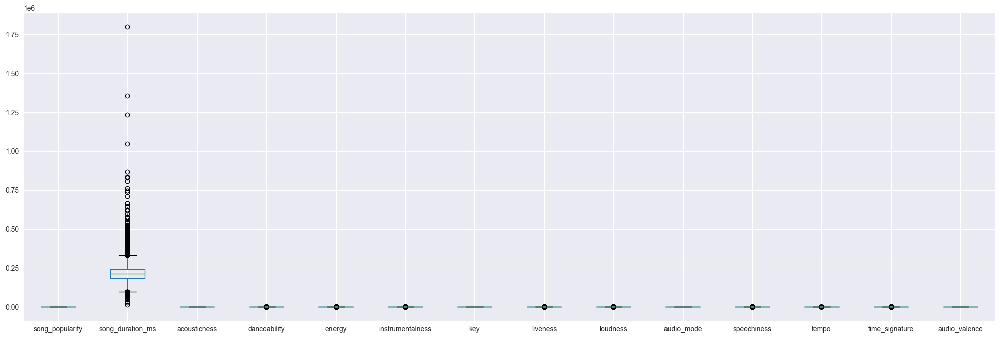

In [18]:
plt.figure(figsize=(25,8))
df.boxplot()
plt.show()

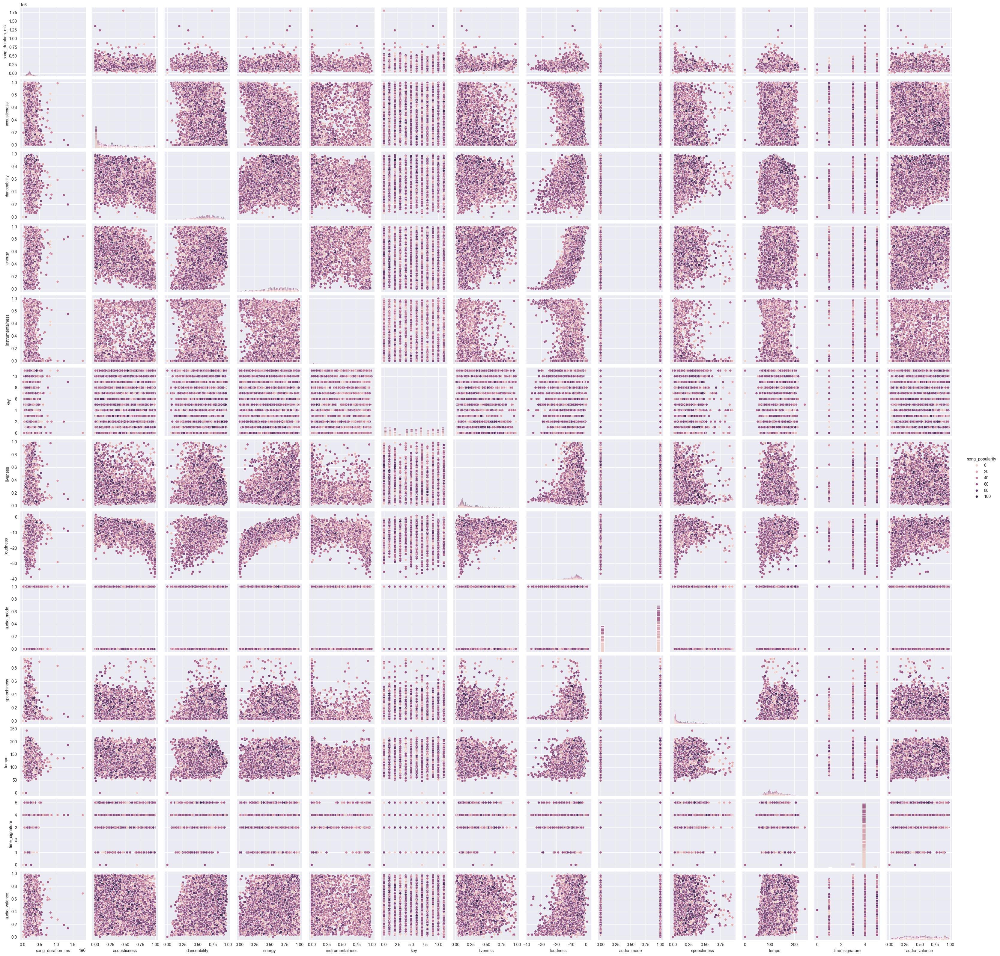

In [19]:
sns.pairplot(df,hue='song_popularity',diag_kind='hist')

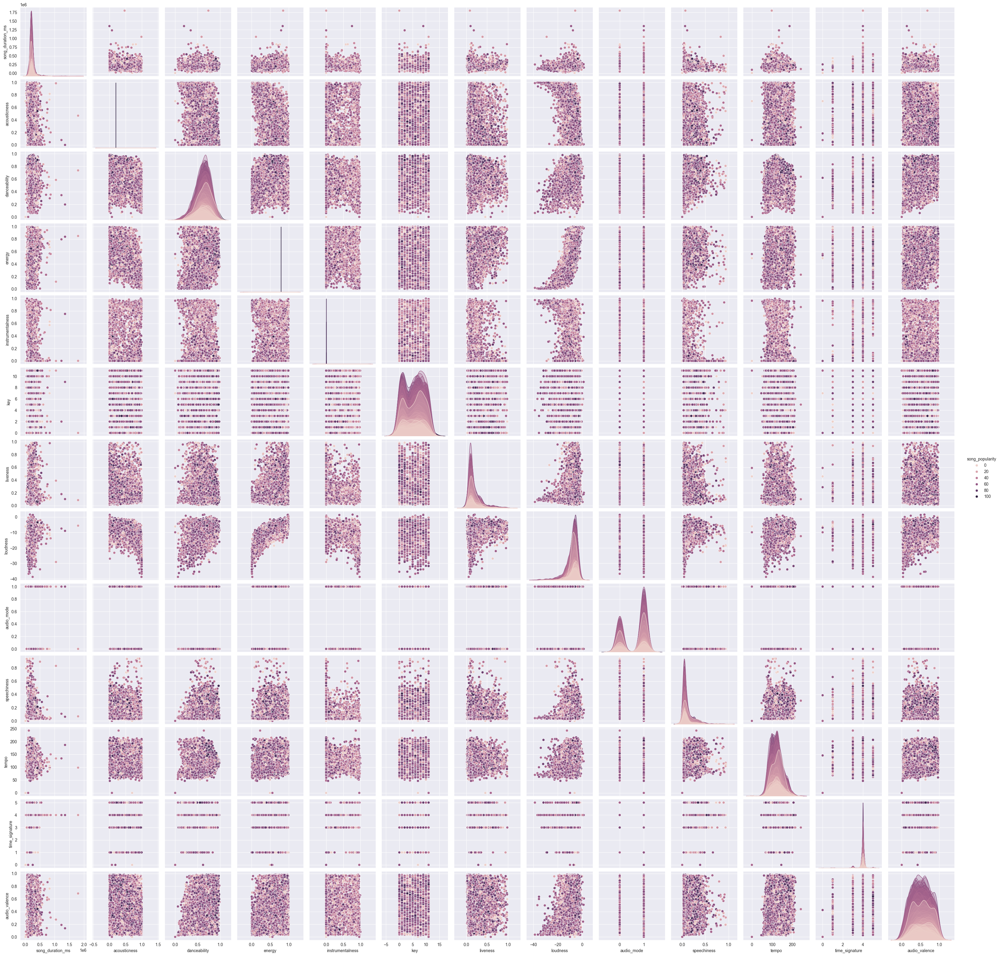

In [20]:
sns.pairplot(df,hue='song_popularity',diag_kind='kde')

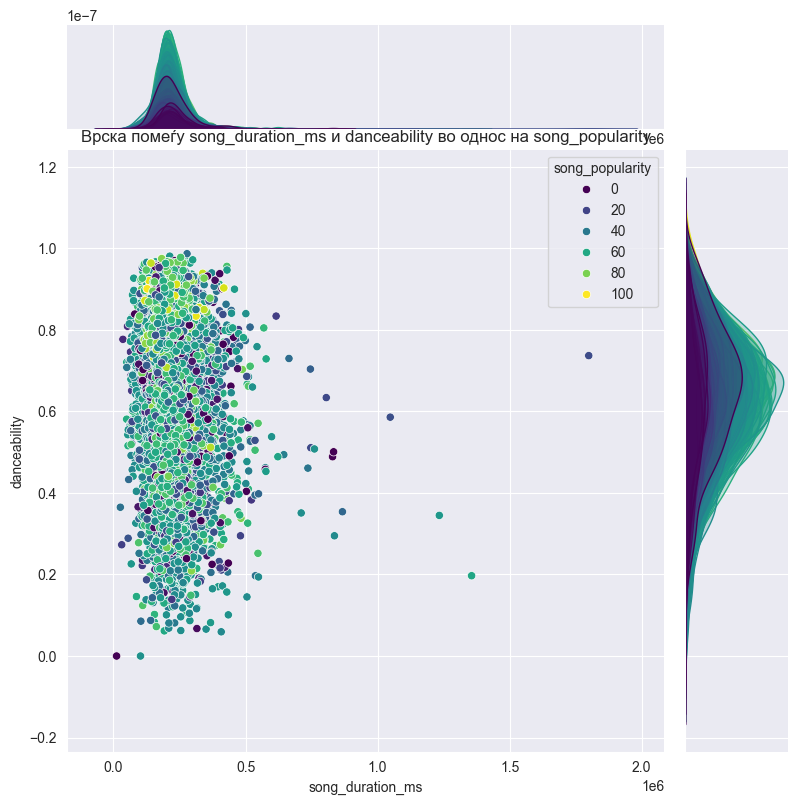

In [24]:
sns.jointplot(x='song_duration_ms', y='danceability', data=df, hue='song_popularity',
              palette='viridis', height=8)
plt.title('Врска помеѓу song_duration_ms и danceability во однос на song_popularity')
plt.show()

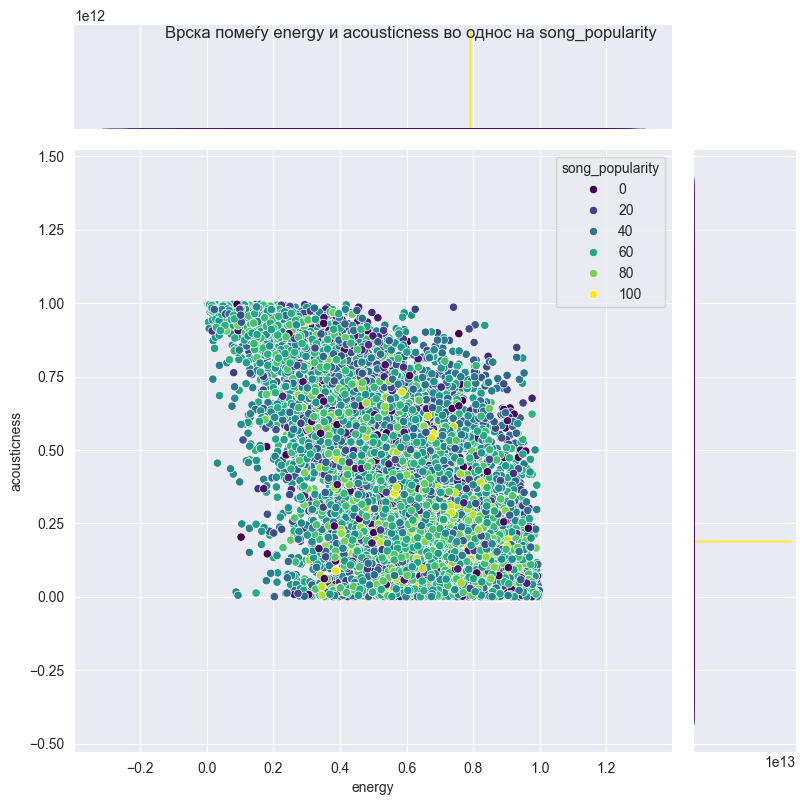

In [25]:
sns.jointplot(x='energy', y='acousticness', data=df, hue='song_popularity',
              palette='viridis', height=8)
plt.suptitle('Врска помеѓу energy и acousticness во однос на song_popularity')
plt.show()

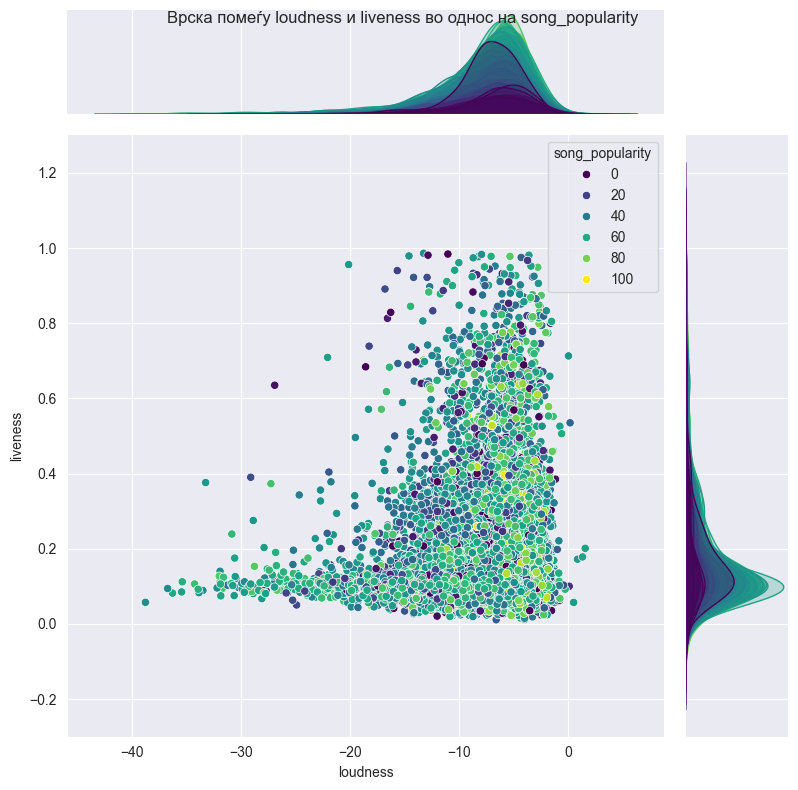

In [26]:
sns.jointplot(x='loudness', y='liveness', data=df, hue='song_popularity',
              palette='viridis', height=8)
plt.suptitle('Врска помеѓу loudness и liveness во однос на song_popularity')
plt.show()

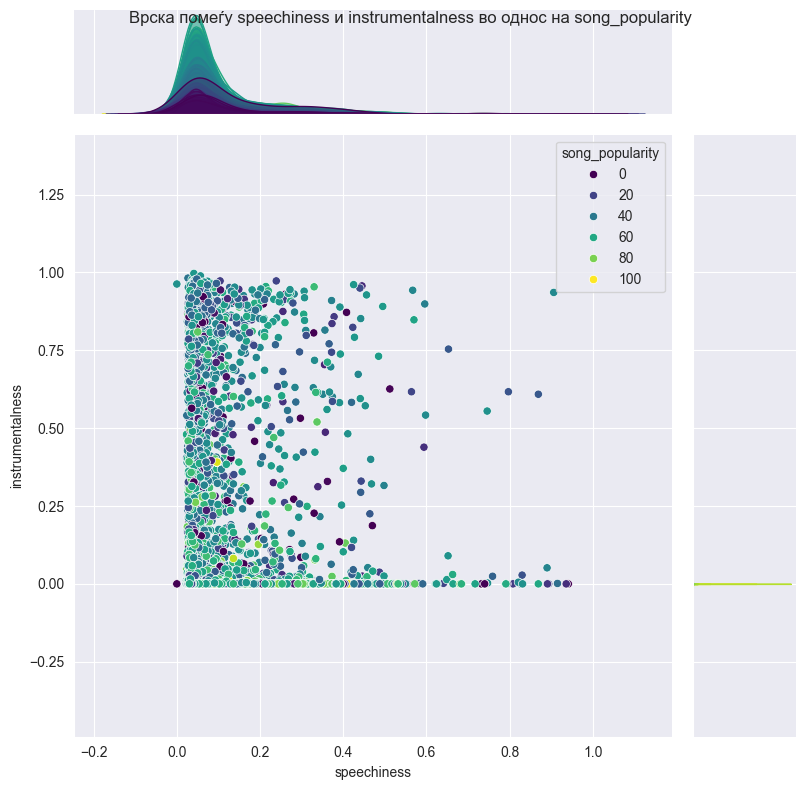

In [27]:
sns.jointplot(x='speechiness', y='instrumentalness', data=df, hue='song_popularity',
              palette='viridis', height=8)
plt.suptitle('Врска помеѓу speechiness и instrumentalness во однос на song_popularity')
plt.show()

<Axes: >

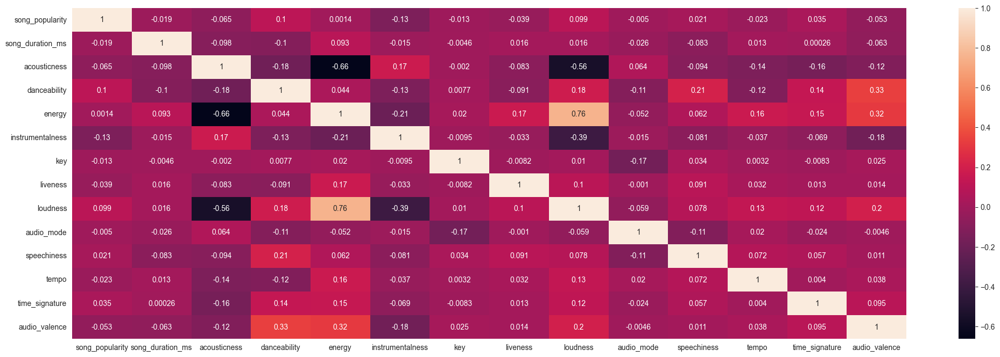

In [29]:
plt.figure(figsize=(25,8))
sns.heatmap(df.corr(), annot=True)

In [30]:
def scaler_transform(dt:pd.DataFrame,col:list):
  for c in col:
    scaler = MinMaxScaler()
    dt[c] = scaler.fit_transform(dt[[c]])

  return dt

In [31]:
df =scaler_transform(df,['song_duration_ms','key','tempo'])
df

,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
0,73,0.140059,0.005520,0.496,0.682,0.000029,0.727273,0.0589,-4.095,1,0.0294,0.689425,4,0.474
1,66,0.114658,0.010300,0.542,0.853,0.000000,0.272727,0.1080,-6.407,0,0.0498,0.434371,4,0.370
2,76,0.122938,0.008170,0.737,0.463,0.447000,0.000000,0.2550,-7.828,1,0.0792,0.511233,4,0.324
3,74,0.114658,0.026400,0.451,0.970,0.003550,0.000000,0.1020,-4.938,1,0.1070,0.505303,4,0.198
4,56,0.118514,0.000954,0.447,0.766,0.000000,0.909091,0.1130,-5.065,1,0.0313,0.709856,4,0.574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18830,60,0.082606,0.893000,0.500,0.151,0.000065,1.000000,0.1110,-16.107,1,0.0348,0.470328,4,0.300
18831,60,0.108354,0.765000,0.495,0.161,0.000001,1.000000,0.1050,-14.078,0,0.0301,0.389100,4,0.265
18832,23,0.095231,0.847000,0.719,0.325,0.000000,0.000000,0.1250,-12.222,1,0.0355,0.538689,4,0.286
18833,55,0.190383,0.945000,0.488,0.326,0.015700,0.272727,0.1190,-12.020,1,0.0328,0.437702,4,0.323


## Train the Models

In [32]:
X,y = df.drop(columns='song_popularity',axis=1),df['song_popularity']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=0)

## Linear Regression

In [33]:
model = LinearRegression()
model.fit(X_train,y_train)
print('Koeficienti',model.coef_)
print('Intercepts:',model.intercept_)

Koeficienti [ -6.34304703  -4.47086882  10.4674986  -11.56159168 -10.91944908
  -0.45654829  -4.79529644   0.6548175    0.16103258  -3.34149777
  -3.24770863   1.62077933  -7.82447834]
Intercepts: 62.11221335053923


In [34]:
pred = model.predict(X_test)
print(f'MSE: {mean_squared_error(y_test,pred)}')
print(f'R2 score: {r2_score(y_test,pred)}')

MSE: 464.4529321261571
R2 score: 0.055771517855038866


## Lasso Regression

In [35]:
model = LassoCV()
model.fit(X_train,y_train)
print('Koeficienti',model.coef_)
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Koeficienti [ -0.          -4.1407815   10.21667423 -11.33664154 -10.67981622
  -0.39758762  -4.54477869   0.65718345   0.15059424  -2.32631622
  -2.78496989   1.54361234  -7.57353102]
Intercepts: 61.07851618685821
Learning rate 0.008109043843931754


In [36]:
pred = model.predict(X_test)
print(f'MSE: {mean_squared_error(y_test,pred)}')
print(f'R2 score: {r2_score(y_test,pred)}')

MSE: 464.75237798807336
R2 score: 0.05516274720870573


## Ridge Regression

In [37]:
model = RidgeCV()
model.fit(X_train,y_train)
print('Koeficienti',model.coef_)
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Koeficienti [ -3.94601845  -4.30294122  10.22022556 -11.27313424 -10.74860921
  -0.4591032   -4.73903372   0.65201324   0.16369134  -2.98484775
  -3.18819479   1.61762335  -7.68802392]
Intercepts: 61.59189853246114
Learning rate 10.0


In [38]:
pred = model.predict(X_test)
print(f'MSE: {mean_squared_error(y_test,pred)}')
print(f'R2 score: {r2_score(y_test,pred)}')

MSE: 464.65451609000195
R2 score: 0.05536169953537706


## Elastic Net

In [39]:
model = ElasticNetCV()
model.fit(X_train,y_train)
print('Koeficienti',model.coef_)
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Koeficienti [-0.         -2.94977218  7.70936931 -8.35475258 -9.09425362 -0.42357276
 -3.80528436  0.6125185   0.10588121 -0.79818966 -2.2607529   1.47796418
 -6.4413225 ]
Intercepts: 59.128692711821515
Learning rate 0.01621808768786351


In [40]:
pred = model.predict(X_test)
print(f'MSE: {mean_squared_error(y_test,pred)}')
print(f'R2 score: {r2_score(y_test,pred)}')

MSE: 466.7478522128048
R2 score: 0.05110596670836054


## Bayes Ridge

In [41]:
model= BayesianRidge()
model.fit(X_train,y_train)
print('Koeficienti',model.coef_)
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Koeficienti [ -3.71825456  -4.27800196  10.17886859 -11.2234478  -10.72227179
  -0.45960286  -4.72925816   0.65138224   0.16370164  -2.93511738
  -3.17840402   1.61691568  -7.66781817]
Intercepts: 61.527149694856234
Learning rate 0.0021900113594755482


In [42]:
pred = model.predict(X_test)
print(f'MSE: {mean_squared_error(y_test,pred)}')
print(f'R2 score: {r2_score(y_test,pred)}')

MSE: 464.6839928899978
R2 score: 0.05530177347571974
